## Dolomiti's ski runs and ski lifts analysis

Dolomiti mountains are a popular destination for skiers. On the province of Bolzano's [Geoportal](http://geocatalogo.retecivica.bz.it/geokatalog/#!home) you can find geodata on both ski runs and ski lifts. On the other hand, on [OpenStreetMap](https://www.openstreetmap.org/#map=19/46.07224/11.11885) we can easily find the coordinates of tourist accommodation in the province's Dolomiti area.

![](https://www.powderhounds.com/site/DefaultSite/filesystem/images/Europe/Italy/Dolomites/dolomititrailmap.jpg)

### Set up

In [1]:
import geopandas as gpd
import contextily as ctx
import os
import pandas as pd
import matplotlib.pyplot as plt
import pyrosm
import folium
from functions import *

### Import Dolomiti's and province of Bolzano GeoDataFrames

In [2]:
province_BZ = load_province('Bolzano', 'data\Limiti01012021_g\ProvCM01012021_g')
geodf_dolomities = load_geodf_dolomities('data\I nove Sistemi delle Dolomiti UNESCO.kml')
dolomities_BZ_clipped = lead_province_clipped_dolomiti('Bolzano', 'data\Limiti01012021_g')
geo_dolomiti_BZ_mun = load_province_dolomiti_mun(21, 'data\Limiti01012021_g')

Plot Dolomiti's municipalities area:

In [3]:
geo_dolomiti_BZ_mun.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

<AxesSubplot:>

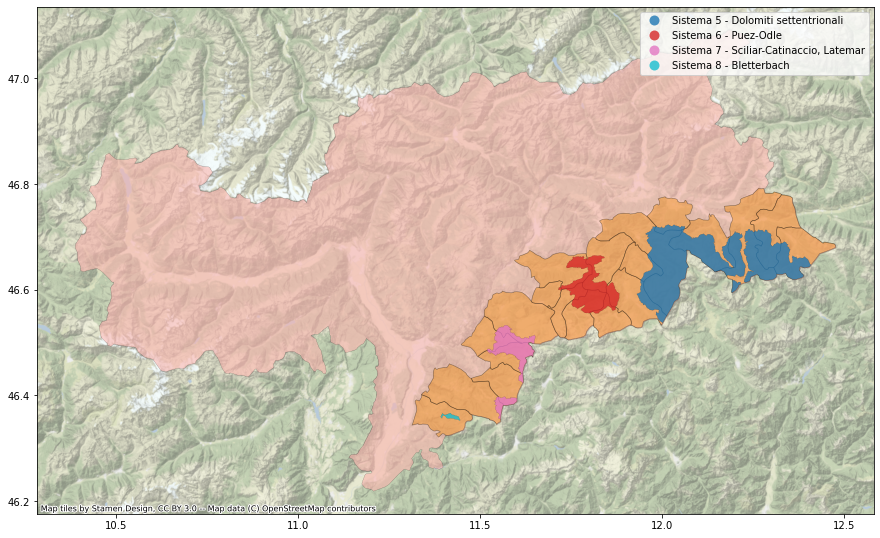

In [4]:
base = province_BZ.to_crs(epsg=4326).plot(
    figsize=(15,15),
    cmap="Pastel1",
    edgecolor="k",
    lw=0.2,
    alpha=0.6
    )
ctx.add_basemap(base, zoom=12, crs=province_BZ.crs.to_string(), source=ctx.providers.Stamen.TerrainBackground, alpha=0.7)

geo_dolomiti_BZ_mun.plot(
    ax=base,
    color="#F18701",
    alpha=0.4,
    edgecolor="k",
    lw=0.6
)

dolomities_BZ_clipped.plot(
    column='Name',
    categorical=True,
    legend=True,
    ax=base,
    edgecolor="k",
    alpha=0.80,
    lw=0.1
    )


### Get the data about ski runs in province of Bolzano

We downloaded the the ski runs' data from province's Geocatalogo.

In [5]:
ski_slopes_path = "data\Ski_slopes_data"
ski_slopes_BZ = gpd.read_file(ski_slopes_path)
ski_slopes_BZ = ski_slopes_BZ.to_crs(epsg=4326)
ski_slopes_BZ.head(5)

,OBJECTID,SKIKEY,PLR,SKIZONE,NAME_IT,NAME_DE,PERIMETER,AREA,SHAPE,geometry
0,19760.0,10.05,10.0,5.0,Danterceppies-Passo Gardena,Danterceppies-Grödnerjoch,642.11,1636.67,None,"POLYGON ((11.75878 46.55751, 11.75879 46.55752..."
1,19761.0,15.02,15.0,2.0,Gardenaccia,Gardenaccia,10772.65,231688.60,None,"POLYGON ((11.90036 46.59903, 11.90042 46.59897..."
2,19762.0,14.01,14.0,1.0,Plan de corones,Kronplatz,1494.77,80420.69,None,"POLYGON ((12.00861 46.74494, 12.00833 46.74483..."
3,19763.0,11.13,11.0,13.0,Filler,Filler,2707.28,186099.19,None,"POLYGON ((11.71263 46.64093, 11.71259 46.64121..."
4,19794.0,15.01,15.0,1.0,Corvara-Badia,Corvara-Abtei,1564.08,18155.70,None,"POLYGON ((11.90192 46.58137, 11.90190 46.58137..."


Plot the data:

<AxesSubplot:>

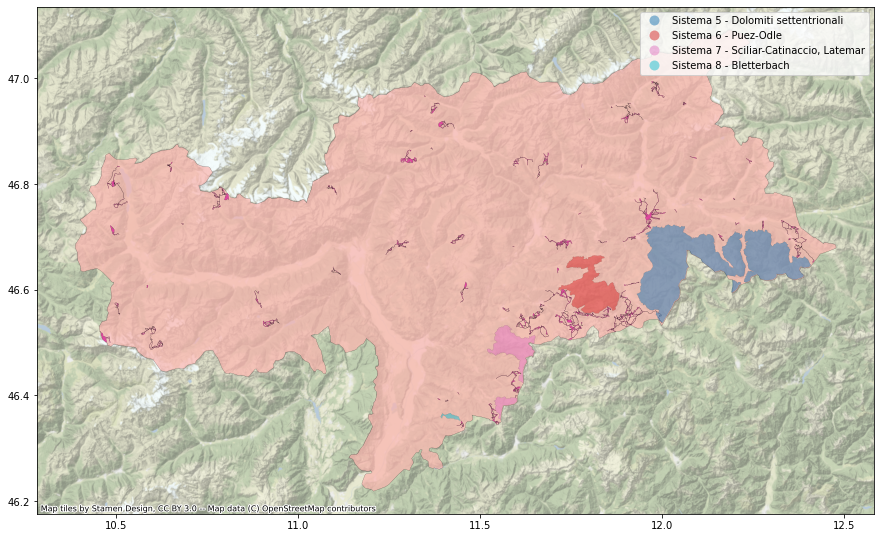

In [6]:
base = province_BZ.to_crs(epsg=4326).plot(
    figsize=(15,15),
    cmap="Pastel1",
    edgecolor="k",
    lw=0.2,
    alpha=0.7
    )
ctx.add_basemap(base, zoom=12, crs=province_BZ.crs.to_string(), source=ctx.providers.Stamen.TerrainBackground, alpha=0.7)

ski_slopes_BZ.plot(
    ax=base,
    color="#E0479E",
    edgecolor="k",
    alpha=1,
    lw=0.1,
    )

dolomities_BZ_clipped.plot(
    column='Name',
    categorical=True,
    legend=True,
    ax=base,
    edgecolor="k",
    alpha=0.5,
    lw=0.1,
    )



#### How many kilometres of ski slopes does the province have?

In [7]:
ski_slopes_BZ_total_area = sum(ski_slopes_BZ.AREA)
print("Province of Bolzano has ", round((ski_slopes_BZ_total_area/10**6), 2), " km\u00b2 of ski slopes.", sep="")

Province of Bolzano has 43.89 km² of ski slopes.


### Get the data about ski lifts and cableways in province of Bolzano

We downloaded the the ski lifts' data from province's Geocatalogo.

In [8]:
ski_lifts_path = "data\Ski_lifts_data"
ski_lifts_BZ = gpd.read_file(ski_lifts_path)
ski_lifts_BZ = ski_lifts_BZ.to_crs(epsg=4326)
ski_lifts_BZ.head(5)

,OBJECTID,SKIKEY,PLR,SKIZONE,NAME_IT,NAME_DE,LENGTH,SHAPE,geometry
0,68881.0,10.04,10.0,4.0,Monte Pana-Ciampinoi-Passo Sella,Monte Pana-Ciampinoi-Sellajoch,1709.12,None,"LINESTRING (11.76168 46.55321, 11.76147 46.552..."
1,68882.0,10.04,10.0,4.0,Monte Pana-Ciampinoi-Passo Sella,Monte Pana-Ciampinoi-Sellajoch,1324.90,None,"LINESTRING (11.76480 46.54955, 11.76470 46.549..."
2,68883.0,10.04,10.0,4.0,Monte Pana-Ciampinoi-Passo Sella,Monte Pana-Ciampinoi-Sellajoch,1557.53,None,"LINESTRING (11.77135 46.53253, 11.76029 46.527..."
3,68884.0,10.04,10.0,4.0,Monte Pana-Ciampinoi-Passo Sella,Monte Pana-Ciampinoi-Sellajoch,970.85,None,"LINESTRING (11.75888 46.52607, 11.75810 46.526..."
4,68885.0,10.04,10.0,4.0,Monte Pana-Ciampinoi-Passo Sella,Monte Pana-Ciampinoi-Sellajoch,547.47,None,"LINESTRING (11.76882 46.52285, 11.76833 46.523..."


Plot province's ski lift together with ski slopes:

<AxesSubplot:>

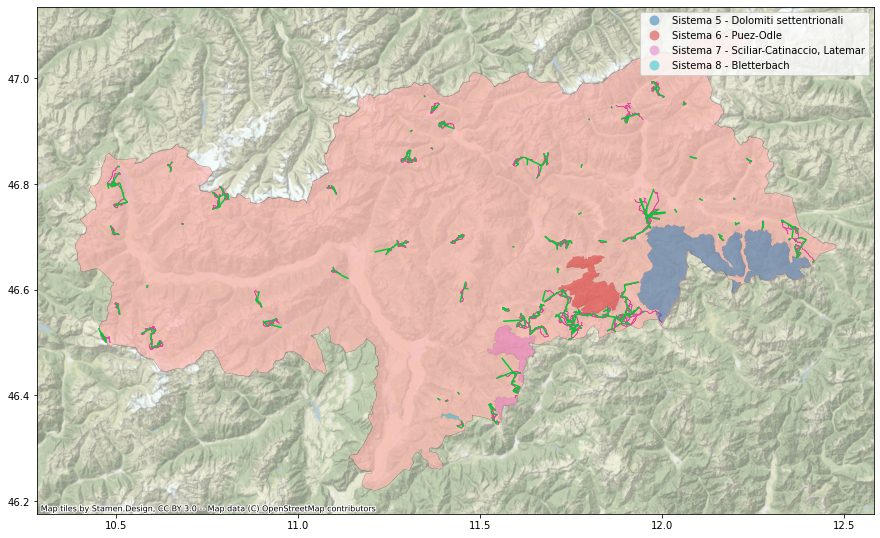

In [9]:
base = province_BZ.to_crs(epsg=4326).plot(
    figsize=(15,15),
    cmap="Pastel1",
    edgecolor="k",
    lw=0.2,
    alpha=0.7
    )
ctx.add_basemap(base, zoom=12, crs=province_BZ.crs.to_string(), source=ctx.providers.Stamen.TerrainBackground, alpha=0.7)

ski_lifts_BZ.plot(
    ax=base,
    color="#00CC33",
    edgecolor="#00CC33",
    alpha=1,
    )

ski_slopes_BZ.plot(
    ax=base,
    color="#E0479E",
    edgecolor="#E0479E",
    alpha=1,
    lw=0.6,
    )

dolomities_BZ_clipped.plot(
    column='Name',
    categorical=True,
    legend=True,
    ax=base,
    edgecolor="k",
    alpha=0.5,
    lw=0.1,
    )

### Explore Dolomiti systems ski runs and lifts

Clip ski runs and lifts with Dolomiti municipalities boundaries in order to get the Dolomiti area ski lifts and ski runs:

In [10]:
ski_slopes_BZ_clipped = ski_slopes_BZ.clip(geo_dolomiti_BZ_mun)
ski_lifts_BZ_clipped = ski_lifts_BZ.clip(geo_dolomiti_BZ_mun)

Recalculate Dolomiti ski runs area:

In [11]:
ski_slopes_dolomiti_mun_areas= ski_slopes_BZ_clipped.to_crs(epsg=32632)
ski_slopes_BZ_clipped["clipped_area"] = ski_slopes_dolomiti_mun_areas['geometry'].area

#### What proportion of ski runs does the Bolzano's Dolomiti area have?

In [12]:
ski_slopes_dolomiti_mun_total_area = sum(ski_slopes_BZ_clipped["clipped_area"])
percentage_ski_slopes = (ski_slopes_dolomiti_mun_total_area/ski_slopes_BZ_total_area)*100
print(round(percentage_ski_slopes,2), "% of ski runs area in province of Bolzano are within the Dolomiti's municipality.", sep="")

49.79% of ski runs area in province of Bolzano are within the Dolomiti's municipality.


The area has almost half of the ski runs of the entire province.

Plot the clipped ski lifts and ski runs:

In [13]:
# dissolve the Dolomiti municipalities borders
area_dolomiti_BZ = dissolve_province_dolomiti_area(21)

<AxesSubplot:>

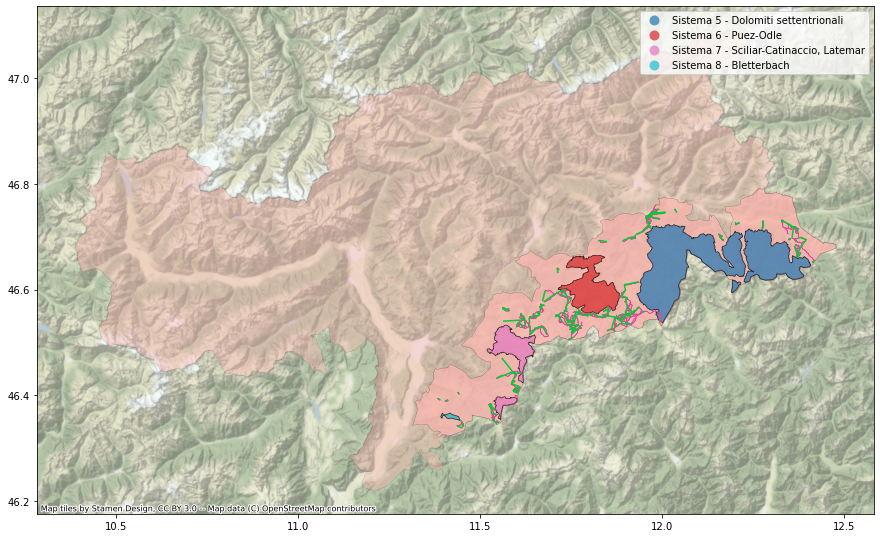

In [14]:
base = province_BZ.plot(
    column='COD_PROV',
    figsize=(15,15),
    cmap="Pastel1",
    edgecolor="k",
    lw=0.2,
    alpha=0.4)

ctx.add_basemap(base, crs=province_BZ.crs.to_string(), source=ctx.providers.Stamen.TerrainBackground, alpha=0.7)

area_dolomiti_BZ.to_crs(epsg=4326).plot(
    figsize=(15,15),
    cmap="Pastel1",
    edgecolor="k",
    lw=0.2,
    alpha=0.7,
    ax=base
    )

dolomities_BZ_clipped.to_crs(epsg=4326).plot(
    column='Name',
    categorical=True,
    legend=True,
    ax=base,
    edgecolor="k",
    alpha=0.7,
    lw=0.8,
    )

ski_lifts_BZ_clipped.plot(
    ax=base,
    color="#00CC33",
    edgecolor="#00CC33",
    alpha=1,
    )

ski_slopes_BZ_clipped.plot(
    ax=base,
    color="#E0479E",
    edgecolor="#E0479E",
    alpha=1,
    lw=0.6,
    )


As we can see from the plot, the ski runs and ski lifts reach as far as the Domolites' foothills.

### How many hotels are there in the Bolzano's Dolomiti area?
#### Get the PBF for the province of Bolzano from [Wikimedia](https://osmit-estratti.wmcloud.org/)

In [15]:
alto_adige_download_pbf_url = "https://osmit-estratti.wmcloud.org/dati/poly/province/pbf/021_Bolzano%20-%20Bozen_poly.osm.pbf"
# download the data
import requests
#request the file
r = requests.get(alto_adige_download_pbf_url, allow_redirects=True)
#save the file
open('data/alto_adige.pbf', 'wb').write(r.content)

45772768

Check available tags:

In [16]:
osm = pyrosm.OSM("data/alto_adige.pbf")
osm.conf.tags.available

['aerialway',
 'aeroway',
 'amenity',
 'boundary',
 'building',
 'craft',
 'emergency',
 'geological',
 'highway',
 'historic',
 'landuse',
 'leisure',
 'natural',
 'office',
 'power',
 'public_transport',
 'railway',
 'route',
 'place',
 'shop',
 'tourism',
 'waterway']

Obtain also turists accomodation and keep only the object within Dolomiti's municipalities of the province:

In [17]:
turism_tag = [
    'alpine_hut',
    'apartment',
    'chalet',
    'guest_house',
    'hostel',
    'hotel']

custom_filter = {'tourism': turism_tag}
tourist_accommodation = osm.get_pois(custom_filter=custom_filter)
tourist_accommodation_clipped = tourist_accommodation[tourist_accommodation.within(area_dolomiti_BZ.geometry.values[0])]

C:\Users\elypa\anaconda3\envs\GEO_PROJ_PYROSM_FIX\lib\site-packages\pyrosm\pyrosm.py:576: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  gdf = get_poi_data(


#### How many tourists' accomodation are there in the area?

In [18]:
print("There are", len(tourist_accommodation_clipped), "tourist accomodation structures in the Dolomiti area.") 

There are 1366 tourist accomodation structures in the Dolomiti area.


Plot the tourist accommodation:

<AxesSubplot:>

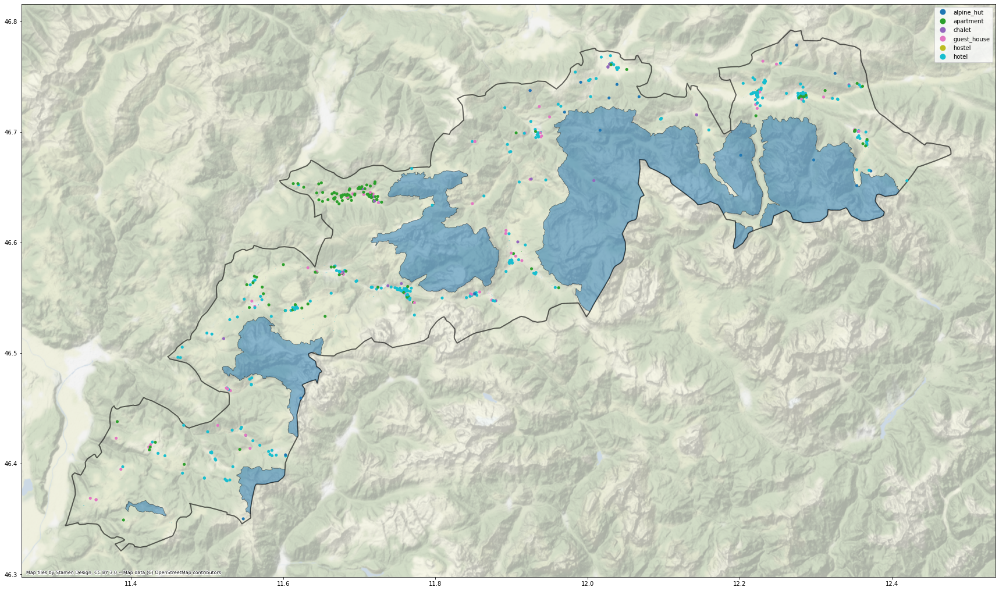

In [19]:

base = area_dolomiti_BZ.plot(
    figsize=(30,30),
    facecolor="none",
    edgecolor="k",
    alpha=0.6,
    lw=2,)

ctx.add_basemap(base, crs=area_dolomiti_BZ.crs.to_string(), source=ctx.providers.Stamen.TerrainBackground, alpha=0.5)

dolomities_BZ_clipped.to_crs(epsg=4326).plot(
    legend=True,
    ax=base,
    edgecolor="k",
    alpha=0.5,
    lw=0.8,
    )

tourist_accommodation_clipped.plot(
    column='tourism',
    categorical=True,
    legend=True,
    ax=base,
    marker='.',
    markersize=100,
    cmap="tab10",
    lw=0.1,
    )

### Which is the nearest hotel for each ski area?
#### Caculate nearest hotel for each ski lift starting point

First we have to find ski lifts (linestring) starting point:


In [20]:
from shapely.geometry import Point

ski_lifts_BZ_clipped['starting_point'] = ""
for idx, row in ski_lifts_BZ_clipped.iterrows():
    ski_lifts_BZ_clipped.loc[idx,'starting_point'] = Point(row.geometry.coords[0])
    
ski_lifts_starting_point = ski_lifts_BZ_clipped
ski_lifts_starting_point.geometry = ski_lifts_starting_point.starting_point

C:\Users\elypa\anaconda3\envs\GEO_PROJ_PYROSM_FIX\lib\site-packages\pandas\core\internals\managers.py:327: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  applied = getattr(b, f)(**kwargs)


#### Is each ski lift correspond to a ski area (one or more ski runs)?

In [21]:
ski_lifts_BZ_clipped.sort_values(by=['NAME_IT'], ascending=True).NAME_IT.unique() == ski_slopes_BZ_clipped.sort_values(by=['NAME_IT'], ascending=True).NAME_IT.unique()

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True])

Plot ski lifts' starting points:

<AxesSubplot:>

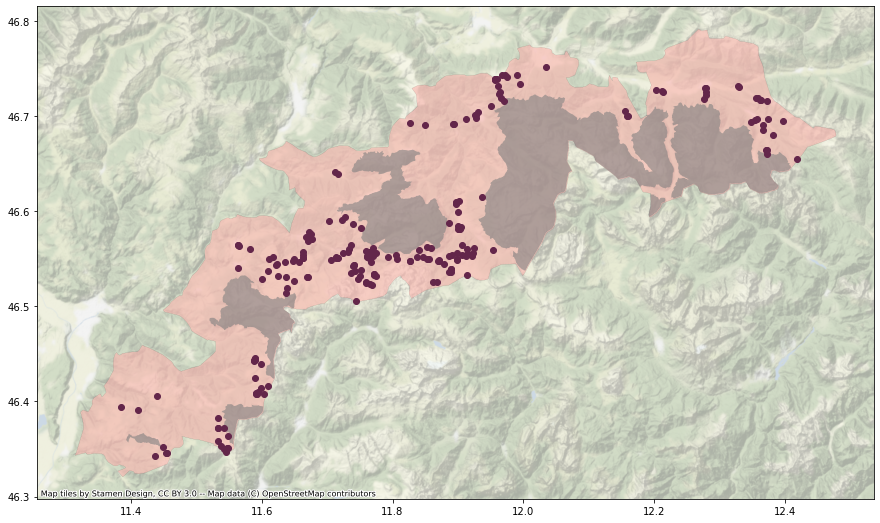

In [22]:
base = area_dolomiti_BZ.plot(
    figsize=(15,15),
    cmap='Pastel1',
    edgecolor="k",
    lw=0.1, 
    alpha=0.6
)

ctx.add_basemap(base, crs=area_dolomiti_BZ.crs.to_string(), source=ctx.providers.Stamen.TerrainBackground, alpha=0.5)


dolomities_BZ_clipped.plot(
    ax=base,
    color="grey",
    alpha=0.6
)

ski_lifts_starting_point.plot(
    ax=base, 
    color='#63264A',

)

Yes, all the ski runs have one or more lines of ski lifts. 
Given the high number of ski lifts starting point, let's plot a cluster visualization them with folium:

In [23]:
# add starting point lon and lat
ski_lifts_starting_point['longitude'] = ski_lifts_starting_point.geometry.x
ski_lifts_starting_point['latitude'] = ski_lifts_starting_point.geometry.y

In [24]:
from folium.plugins import MarkerCluster
map=folium.Map(location=[ski_lifts_starting_point.to_crs(epsg=4326).geometry.y.mean(), ski_lifts_starting_point.to_crs(epsg=4326).geometry.x.mean()], tiles='cartodbpositron', zoom_start=10)

def getMarker(lat,lon, message,tip,inconstyle):
      marker = folium.Marker(location=[lat,lon],
                         popup=message,
                         tooltip=tip,
                         icon=inconstyle)
      return marker

marker_cluster = MarkerCluster().add_to(map)

for _, r in area_dolomiti_BZ.iterrows():
    # Without simplifying the representation of each borough,
    # the map might not be displayed
    sim_geo = gpd.GeoSeries(r['geometry']).simplify(tolerance=0.001)
    geo_j = sim_geo.to_json()
    geo_j = folium.GeoJson(data=geo_j,
                           style_function=lambda x: {'fillColor': 'orange'})
    geo_j.add_to(map)

for index, row in ski_lifts_starting_point.iterrows():
  icon=folium.features.CustomIcon('https://emojipedia-us.s3.dualstack.us-west-1.amazonaws.com/thumbs/160/google/313/mountain-cableway_1f6a0.png',icon_size=(24,24))
  message = '<strong>ski lift ID:'+ str(row['OBJECTID']) + "</strong><br/>" + row['NAME_IT']
  tip = message + '<br/>' + row['NAME_DE']
  marker = getMarker(row['latitude'],row['longitude'],message, tip, icon) 
  #add to marker cluster 
  marker.add_to(marker_cluster)
map

Given their large number, we can do the same with tourist accomodation structures:
We first have to calculate the geometry centroid since some records have a poligon geometry

In [25]:
import warnings
warnings.simplefilter("ignore")

tourist_accommodation_clipped["centroid"] = tourist_accommodation_clipped.to_crs(epsg=32632).centroid
tourist_accommodation_clipped['longitude'] = tourist_accommodation_clipped.centroid.to_crs(epsg=4326).x
tourist_accommodation_clipped['latitude'] = tourist_accommodation_clipped.centroid.to_crs(epsg=4326).y

In [26]:
map=folium.Map(location=[ski_lifts_starting_point.to_crs(epsg=4326).geometry.y.mean(), ski_lifts_starting_point.to_crs(epsg=4326).geometry.x.mean()], tiles='cartodbpositron', zoom_start=10)

def getMarker(lat,lon, message,tip,inconstyle):
      marker = folium.Marker(location=[lat,lon],
                         popup=message,
                         tooltip=tip,
                         icon=inconstyle)
      return marker

marker_cluster = MarkerCluster().add_to(map)

for _, r in area_dolomiti_BZ.iterrows():
    # Without simplifying the representation of each borough,
    # the map might not be displayed
    sim_geo = gpd.GeoSeries(r['geometry']).simplify(tolerance=0.001)
    geo_j = sim_geo.to_json()
    geo_j = folium.GeoJson(data=geo_j,
                           style_function=lambda x: {'fillColor': 'orange'})
    geo_j.add_to(map)


for index, row in tourist_accommodation_clipped.iterrows():
  icon=folium.features.CustomIcon('https://emojipedia-us.s3.dualstack.us-west-1.amazonaws.com/thumbs/160/google/298/bed_1f6cf-fe0f.png',icon_size=(24,24))
  message = '<strong>OSM ID:'+ str(row['id']) + "</strong><br/>" + row['tourism']
  marker = getMarker(row['latitude'],row['longitude'],message, tip, icon)
  #add to marker cluster 
  marker.add_to(marker_cluster)
map

---



---

In [36]:

if not os.path.exists('ski_lifts_starting_point'):
    os.mkdir("ski_lifts_starting_point")
    ski_lifts_starting_point.to_file('ski_lifts_starting_point/ski_lifts_starting_point.shp')
    
if not os.path.exists('tourist_acc_BZ_clipped'):
    os.mkdir("tourist_acc_BZ_clipped")
    tourist_acc_BZ_clipped.to_file('tourist_acc_BZ_clipped/tourist_acc_BZ_clipped.shp')   

In [27]:
buildings = osm.get_buildings()
buildings_clipped = buildings[buildings.within(area_dolomiti_BZ.geometry.values[0])]

In [28]:
nodes, edges = osm.get_network(nodes=True)


In [ ]:
nodes = nodes[nodes.within(area_dolomiti_BZ.geometry.values[0])]
edges = edges[edges.within(area_dolomiti_BZ.geometry.values[0])]

In [30]:
G = osm.to_graph(nodes, edges, graph_type="networkx")

KeyboardInterrupt: 

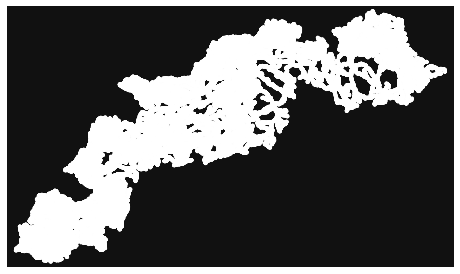

In [ ]:
import osmnx  as ox
ox.plot_graph(G)
plt.show()

In [ ]:
lon = ski_lifts_BZ_clipped.iloc[0].starting_point.x
lat = ski_lifts_BZ_clipped.iloc[0].starting_point.y

point_ski_lift = lat, lon
point_ski_lift

(46.372412524457594, 11.532431027096811)

In [ ]:
lon = tourist_accommodation.iloc[0].geometry.x
lat = tourist_accommodation.iloc[0].geometry.y

point_hotel = lat, lon
point_hotel

(46.466007232666016, 11.530515670776367)

In [ ]:
point_nearest_ski_lift = ox.get_nearest_node(G, point_ski_lift)
point_nearest_trainstation = ox.get_nearest_node(G, point_hotel)

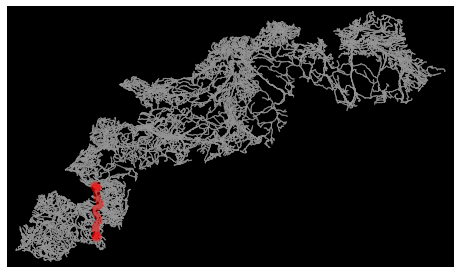

In [ ]:
route = ox.shortest_path(G, point_nearest_trainstation, point_nearest_ski_lift, weight='length')
fig, ax = ox.plot_graph_route(G, route, route_linewidth=6, node_size=0, bgcolor='k')
plt.show()

In [ ]:
address_coords = (ski_lifts_BZ_clipped["starting_point"].values[0].y, ski_lifts_BZ_clipped["starting_point"].values[0].x)
closest_point_to_address = ox.get_nearest_node(G, address_coords)

closest_point_to_address

6207135806

In [ ]:
ii = ox.shortest_path(closest_point_to_address,)

---

## Idea

In [ ]:
tourist_accommodation_clipped

,changeset,lon,timestamp,version,tags,id,lat,addr:city,addr:country,addr:housenumber,...,chalet,guest_house,hostel,tourism,geometry,osm_type,ref,centroid,longitude,latitude
0,0.0,11.530516,1525556359,4,"{""stars"":""3"",""amenity"":""restaurant"",""internet_...",61100894,46.466007,None,None,None,...,None,None,None,guest_house,POINT (11.53052 46.46601),node,NaN,POINT (694289.065 5148937.646),11.530516,46.466007
1,0.0,12.224194,1553566287,6,"{""amenity"":""cafe""}",279714466,46.734859,None,None,3,...,None,None,None,guest_house,POINT (12.22419 46.73486),node,NaN,POINT (746323.390 5180750.119),12.224194,46.734859
3,0.0,11.990932,1488185718,4,"{""amenity"":""restaurant"",""alt_name"":""Lorenzih\u...",282865095,46.744804,None,None,None,...,None,None,None,alpine_hut,POINT (11.99093 46.74480),node,NaN,POINT (728461.565 5181150.634),11.990932,46.744804
4,0.0,12.017969,1217868208,1,None,283352615,46.767544,None,None,None,...,None,None,None,hotel,POINT (12.01797 46.76754),node,NaN,POINT (730429.603 5183756.201),12.017969,46.767544
5,0.0,12.011264,1244576942,2,None,283352618,46.748154,None,None,None,...,None,None,None,hotel,POINT (12.01126 46.74815),node,NaN,POINT (730000.228 5181582.078),12.011264,46.748154
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4866,NaN,NaN,1635325492,1,"{""building"":""house""}",996828706,NaN,La Val - Wengen - La Valle,None,8-1,...,NaN,None,NaN,chalet,"POLYGON ((11.92583 46.65730, 11.92595 46.65722...",way,None,POINT (723859.908 5171240.646),11.925951,46.657297
4869,NaN,NaN,1643994328,5,"{""building"":""commercial"",""ref:vatin"":""IT015697...",1024873651,NaN,None,None,None,...,NaN,None,NaN,hotel,"POLYGON ((11.76005 46.55217, 11.76015 46.55223...",way,None,POINT (711590.759 5159096.406),11.760229,46.552120
4870,0.0,NaN,1479223061,2,"{""type"":""multipolygon"",""building"":""yes""}",16756694780,NaN,None,None,None,...,NaN,NaN,NaN,hotel,"MULTIPOLYGON (((11.52457 46.42656, 11.52442 46...",relation,NaN,POINT (694002.390 5144543.928),11.524959,46.426586
4871,0.0,NaN,1553827650,3,"{""type"":""multipolygon"",""building"":""yes""}",16768549076,NaN,None,None,None,...,NaN,NaN,NaN,hotel,"MULTIPOLYGON (((11.53258 46.42947, 11.53303 46...",relation,NaN,POINT (694618.140 5144876.999),11.533103,46.429404


0



KeyboardInterrupt



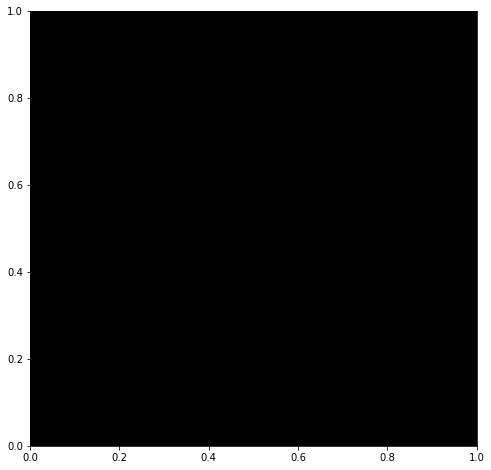

In [ ]:
#from tdqm import tqdm

points = []

# iterate over points
# for idx,row in tqdm(tourist_accommodation_clipped):
for idx,row in tourist_accommodation_clipped.iterrows():
    
    print(idx)
    
    # obtain point info
    hotel_lat = row["lat"]
    hotel_lon = row["lon"]
    point_hotel = hotel_lat, hotel_lon
    
    # obtain nearest point on map
    point_hotel_nearest = ox.get_nearest_node(G, point_hotel)
    
    # calculate route and show it
    route = ox.shortest_path(G, point_nearest_trainstation, point_nearest_ski_lift, weight='length')
    fig, ax = ox.plot_graph_route(G, route, route_linewidth=6, node_size=0, bgcolor='k')
    plt.show()
    
    # add it to list
    points.append(point_hotel_nearest)

In [ ]:
points[0:5]

In [ ]:
tourist_accommodation["geometry"]

In [ ]:

lat = tourist_accommodation.iloc[0].geometry.y
lon = tourist_accommodation.iloc[0].geometry.x

point_hotel = lat, lon
point_hotel

In [ ]:
tourist_acc_path = "data\Pernottamenti"
tourist_acc_BZ = gpd.read_file(tourist_acc_path)
tourist_acc_BZ = tourist_acc_BZ.to_crs(epsg=4326)
tourist_acc_BZ

,ISTAT,DID,DESCR_DE,DESCR_IT,EMAIL,WEB,PHONE,NCIV,ADDRESS_DE,ADDRESS_IT,ROOMS,APPARTMENT,BEDS,OWNERS,CTCLASS,CATEGORY_D,CATEGORY_I,geometry
0,21075.0,281940.0,Gruberhof,Gruberhof,info@gruber-hof.info,None,0472 - 454126,187.0,AHNERBERG 3,VIA MONTANO 3,NaN,1.0,6.0,PUTZER ERIKA,2.0,FW - Urlaub a. d. Bauernhof 2 Blumen,Appartamenti - AgriTur 2 fiori,POINT (11.70256 46.79461)
1,21023.0,281972.0,EBENHOF,None,None,None,None,5258.0,WEINBERG 24,VIA WEINBERG 24,NaN,2.0,8.0,LANTSCHNER MARKUS,2.0,FW - Urlaub a. d. Bauernhof 3 Blumen,Appartamenti - AgriTur 3 fiori,POINT (11.44277 46.48557)
2,21103.0,281993.0,ALPENHEIM,SPIESS HELMUT,None,None,0473 - 832197,19.0,MÜHLWEG 5,VIA DEI MULINI 5,NaN,3.0,8.0,SPIESS HELMUT,3.0,Ferienwohnungen 3 Sonne,Appartamenti 3 sole,POINT (10.46310 46.64542)
3,21103.0,282000.0,Fodor Lenke,None,None,None,None,26.0,MÜHLWEG 16,VIA DEI MULINI 16,NaN,1.0,4.0,FODOR LENKE,3.0,Ferienwohnungen 2 Sonne,Appartamenti 2 sole,POINT (10.45947 46.64475)
4,21103.0,282034.0,HAUS ABART,SCHALLER VERONIKA,None,None,0473 - 832195,261.0,TELSWEG 4,VIA TELS 4,3.0,3.0,18.0,SCHALLER VERONIKA,3.0,PRIVATZIMMERVERMIETER und FERIENWOHNUNGEN 2 Sonne,AFFITTO DI CAMERE E APPARTAMENTI 2 soli,POINT (10.46129 46.64258)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11354,21013.0,513047.0,HOFBAUER,HOFBAUER,None,None,None,27583.0,GISSBACHSTRASSE 35/A,VIA GISSBACH 35/A,NaN,1.0,4.0,PIFFRADER MICHAEL,2.0,None,None,POINT (11.92832 46.81713)
11355,21008.0,516811.0,GRIESBAUERGUT,MUMELTER GEORG,None,None,None,10322.0,RENTSCHNER STRASSE 66,VIA RENCIO 66,NaN,NaN,NaN,MUMELTER GEORG,2.0,None,None,POINT (11.37806 46.49750)
11356,21086.0,526474.0,TRATTMANN,TRATTMANN,kurt.thaler@pec.sbb.it,None,None,1061.0,REINSWALD 22,FRAZIONE SAN MARTINO 22,NaN,1.0,4.0,THALER KURT,2.0,None,None,POINT (11.41672 46.69902)
11357,21092.0,524632.0,ALMA,ALMA,None,None,None,766.0,ST.JOSEFSTRASSE 51,VIA S.GIUSEPPE 51,NaN,15.0,30.0,ALMA GMBH,1.0,RESIDENCE 3 Sterne Superior,RESIDENCE 3 Stelle Superior,POINT (12.36933 46.68629)


Check the geometry, are they all Points?

In [ ]:
tourist_acc_BZ.geom_type.unique()

array(['Point'], dtype=object)

In [ ]:
tourist_acc_BZ_clipped = tourist_acc_BZ[tourist_acc_BZ.within(area_dolomiti_BZ.geometry.values[0])]
tourist_acc_BZ_clipped

,ISTAT,DID,DESCR_DE,DESCR_IT,EMAIL,WEB,PHONE,NCIV,ADDRESS_DE,ADDRESS_IT,ROOMS,APPARTMENT,BEDS,OWNERS,CTCLASS,CATEGORY_D,CATEGORY_I,geometry
10,21082.0,282818.0,HOTEL PÜTIA HH,HOTEL PÜTIA CM,info@putia.com,http://www.putia.com,0471 - 520114,1711.0,STR. SANT ANTONE 21,STRADA SANT ANTONE 21,34.0,1.0,69.0,HOTEL PÜTIA SAS DI PROUSCH HEINZ & CO.,1.0,HOTEL 3 Sterne,HOTEL 3 Stelle,POINT (11.85176 46.69088)
16,21082.0,282901.0,CHALET MORNÀ,CHALET MORNÀ,info@chaletmorna.it,http://www.chaletmorna.it,0474 590133,2413.0,STR. PECËI 8,STRADA PECËI 8,NaN,8.0,18.0,CLARA ARCANGELO,1.0,RESIDENCE 4 Sterne,RESIDENCE 4 Stelle,POINT (11.86379 46.63931)
17,21077.0,282043.0,RESTAURANT BAR PIZZERIA SPORTZENTRUM INNICHEN ...,RISTORANTE BAR PIZZERIA SPORTZENTRUM INNICHEN ...,None,None,None,719.0,AM ERSCHBANN 3,VIA PASCOLO 3,NaN,NaN,NaN,SCHÄFER HANNES,4.0,None,None,POINT (12.27783 46.72911)
21,21019.0,281775.0,SALTNERHÜTTE SALTRIA,None,info@saltner.eu,None,0471-727804,7467.0,SALTRIA 49,VIA SALTRIA 49,NaN,NaN,NaN,CIABATTONI ALEXANDER,4.0,None,None,POINT (11.67480 46.53101)
22,21061.0,281795.0,SASKIA C.M./HH.,SASKIA C.M./HH.,None,None,0471 - 796160,1624.0,JOHANN BAPTIST PURGER - STRASSE 71,VIA JOHANN BAPTIST PURGER 71,3.0,NaN,25.0,VINATZER GABRIELLA,1.0,RESIDENCE 2 Sterne,RESIDENCE 2 Stelle,POINT (11.66579 46.57468)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11337,21089.0,524838.0,APARTMENTS RONCH,APARTMENTS RONCH,demetz.guido@b2bdign.,None,0471793469,10214.0,STR. LA SËLVA 82/A,STR. LA SËLVA 82/A,NaN,1.0,4.0,DEMETZ GUIDO REINHOLD,3.0,None,None,POINT (11.73572 46.55738)
11339,21089.0,523554.0,SOOCHIC,SOOCHIC,ronnielampre@yahoo.it,None,0471 794456,643.0,STR. PLAN DE GRALBA 19,STR. PLAN DE GRALBA 19,NaN,NaN,NaN,LAMPREDI RONNIE,4.0,II Kateogorie,II categoria,POINT (11.77327 46.53270)
11347,21089.0,523511.0,TLESURA,TLESURA,info@tlesurasuite.com,None,None,8994.0,STR. PLAN 62/A,STR. PLAN 62/A,NaN,1.0,4.0,RUNGGALDIER MARIA THERESIA,3.0,Ferienwohnungen 3 Sonne,Appartamenti 3 sole,POINT (11.77103 46.54493)
11351,21085.0,517402.0,SERENA,None,None,None,None,490.0,STR. VAL 93,STR. VAL 93,NaN,1.0,4.0,INSAM UGO ENGELBERTO,3.0,None,None,POINT (11.72462 46.55923)
